In [3]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from nilearn import plotting
from matplotlib import cm
import warnings
warnings.filterwarnings("ignore")

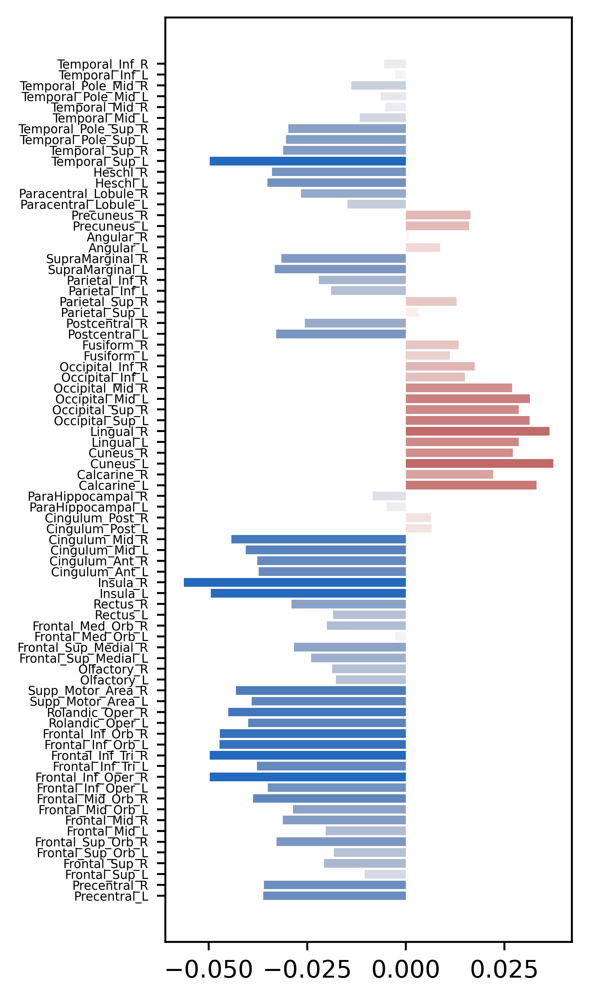

In [4]:
# Cluster-centroid WEiDA eigenvectors for MS states

centroids = pd.read_csv("./WEiDA4_atlasAAL78_DBS/Vemp.csv", header=None)
feature=pd.read_csv("./data/DBS/sub-STNoff02_BOLD_AAL78_MNI_basic36_sm6.csv")
features = feature.drop(columns=['Unnamed: 0']).columns
centroids['fea']=features
centroids.columns=['MS1','MS2','MS3','MS4','fea']

x = centroids['MS2']
y = centroids['fea']

cmap = cm.get_cmap('vlag')  

normalized_colors = (x - (-0.05)) / (0.05 - (-0.05))  
colors = cmap(normalized_colors)  

fig=plt.figure(figsize=(3,7),dpi=500)
plt.barh(y, x, color=colors, align='center')
plt.tick_params(axis='y', labelsize=5)

plt.show()

[-0.056238   -0.05623014 -0.05622757 ...  0.03666815  0.03666982
  0.036693  ]
0.037623 -0.056238


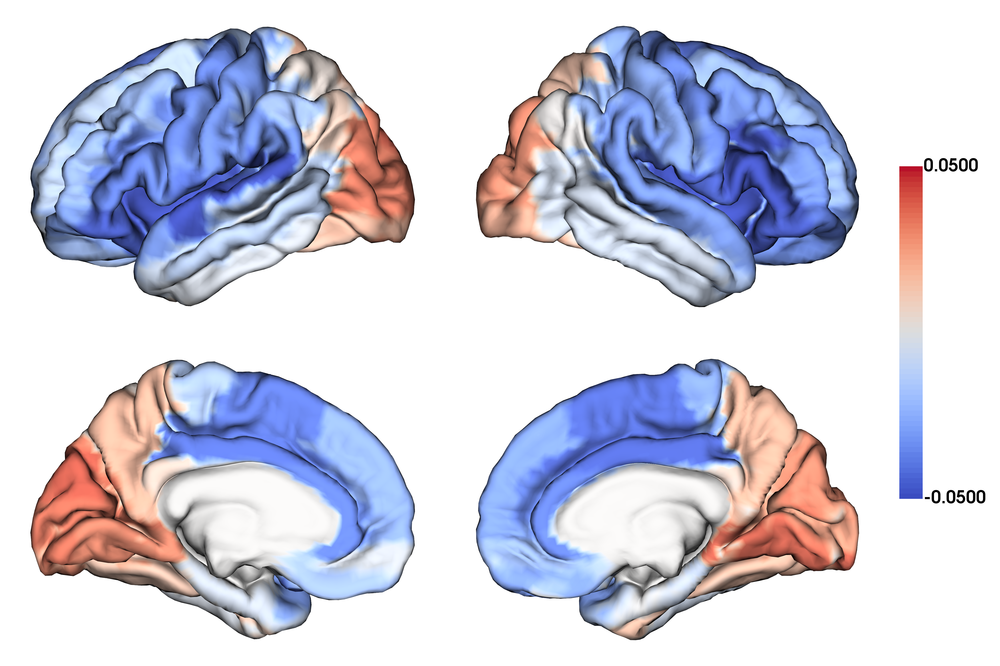

In [6]:
# cortical projection of MS states

from brainspace.datasets import load_fsa5
from brainspace.plotting import plot_hemispheres
import nibabel as nib

centroids = pd.read_csv("./WEiDA4_atlasAAL78_DBS/Vemp.csv", header=None)    # Cluster-centroid WEiDA eigenvectors for 4 MS states
img_org = nib.load("./data/atlas/AAL78_MNI.nii.gz")                  # AAL1 cortical atlas
img = img_org.get_fdata()
all_labels = np.unique(img)

for j in range(4):

    check_img = copy.copy(img)

    for i in range(1,79):
        check_img[img == all_labels[i]] = centroids[j][i-1]

    imga = nib.Nifti1Image(check_img, img_org.affine)
    pth = "./WEiDA4_atlasAAL78_DBS/state" + str(j) + ".nii.gz"
    nib.save(imga, 'pth')

# transfer from MNI152 space to fsaverage10k surface space
mni = "./WEiDA4_atlasAAL78_DBS/state2.nii.gz"
fsavg = transforms.mni152_to_fsaverage(mni, '10k')
fsa_lh, fsa_rh = fsavg
pth_l = "./WEiDA4_atlasAAL78_DBS/State2_MNIparc78_surffsag10k_L.gii.gz"
pth_r = "./WEiDA4_atlasAAL78_DBS/State2_MNIparc78_surffsag10k_R.gii.gz"
nib.save(fsa_lh, pth_l)
nib.save(fsa_rh, pth_r)

# plotting
imgl = nib.load("./WEiDA4_atlasAAL78_DBS/State2_MNIparc78_surffsag10k_L.gii.gz")
imgr = nib.load("./WEiDA4_atlasAAL78_DBS/State2_MNIparc78_surffsag10k_R.gii.gz")
labell = imgl.agg_data()
labelr = imgr.agg_data()
print(np.unique(labelr))

labeling = np.concatenate((labell, labelr))
# labeling[labeling==0] = np.nan
print(np.max(labeling), np.min(labeling))

# Load fsaverage5 surfaces
surf_lh, surf_rh = load_fsa5()

plot_hemispheres(surf_lh, surf_rh, array_name=labeling, color_range=(-0.05,0.05), cmap='coolwarm', layout_style='grid', embed_nb=True, scale=5, color_bar=True, zoom=1.5, size=(900, 600))


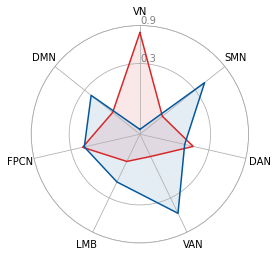

In [11]:
# Radar chart of state overlapping with RSN

import math

# correlations between positive modules and RSNs
Rpos = pd.read_csv("./WEiDA4_atlasAAL78_DBS/OverlapRSN_Rpos.csv", header=None)
# correlations between negative modules and RSNs
Rneg = pd.read_csv("./WEiDA4_atlasAAL78_DBS/OverlapRSN_Rneg.csv", header=None)

df = pd.DataFrame(np.zeros([2,7]),columns=['VN','SMN','DAN','VAN','LMB','FPCN','DMN'])
df.iloc[0,:] = Rpos.iloc[1,:]        # State2
df.iloc[1,:] = Rneg.iloc[1,:]
df['group'] = ['pos','nag']
 
var_names = df.columns[:7]
 
angles = [i/float(len(var_names))*2*math.pi for i in range(len(var_names))]  
angles += angles[:1]  
 
ax = plt.subplot(111, polar=True)
 
ax.set_theta_offset(math.pi / 2)
ax.set_theta_direction(-1)
 
values = df.loc[0].drop('group').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1.5, linestyle='solid', label="pos", color='tab:red')
ax.fill(angles, values, 'tab:red', alpha=0.1) 
 
values = df.loc[1].drop('group').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1.5, linestyle='solid', label="nag", color='#04579B')
ax.fill(angles, values, '#04579B', alpha=0.1)
ax.spines['polar'].set_edgecolor('darkgray')  
 
plt.xticks(angles[:-1], var_names, color="black")    # color="w"
ax.set_rlabel_position(0)
plt.yticks([0.3,0.9], ['0.3','0.9'], color="grey", size=10)     # [],color="w"
# plt.savefig("./figure/overlapFN_state2.png", dpi=500)  
plt.show()


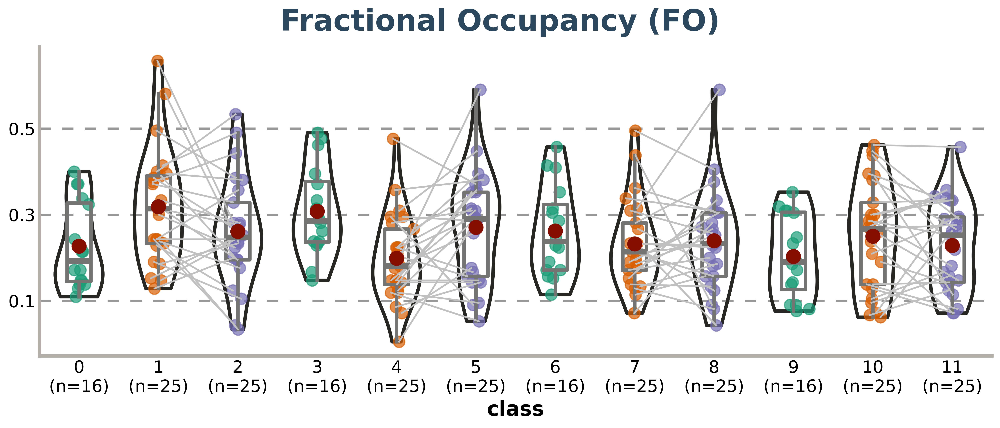

In [15]:
# violin plot for group comparisons

import scipy.stats as st

scl1 = pd.read_csv("./WEiDA4_atlasAAL78_DBS/P1emp.csv", header=None)  # HC
scl2 = pd.read_csv("./WEiDA4_atlasAAL78_DBS/P2emp.csv", header=None)  # DBS-OFF
scl3 = pd.read_csv("./WEiDA4_atlasAAL78_DBS/P3emp.csv", header=None)  # DBS-ON
pp = [None] * 66 * 4
pp[0:16] = scl1.iloc[0:16,0]
pp[16:41] = scl2.iloc[16:41,0]
pp[41:66] = scl3.iloc[41:66,0]
pp[66:82] = scl1.iloc[0:16,1]
pp[82:107] = scl2.iloc[16:41,1]
pp[107:132] = scl3.iloc[41:66,1]
pp[132:148] = scl1.iloc[0:16,2]
pp[148:173] = scl2.iloc[16:41,2]
pp[173:198] = scl3.iloc[41:66,2]
pp[198:214] = scl1.iloc[0:16,3]
pp[214:239] = scl2.iloc[16:41,3]
pp[239:264] = scl3.iloc[41:66,3]
data = pd.DataFrame(pp,columns=['P'])

group = []
for i in range(16):
    group.append(0)
for i in range(16,41):
    group.append(1)
for i in range(41,66):
    group.append(2)
for i in range(66,82):
    group.append(3)
for i in range(82,107):
    group.append(4)
for i in range(107,132):
    group.append(5)
for i in range(132,148):
    group.append(6)
for i in range(148,173):
    group.append(7)
for i in range(173,198):
    group.append(8)
for i in range(198,214):
    group.append(9)
for i in range(214,239):
    group.append(10)
for i in range(239,264):
    group.append(11)
data['group']=group

classes = sorted(data["group"].unique()) 
 
y_data = [data[data["group"] == c]["P"].values for c in classes] 
 
jitter = 0.04
x_data = [np.array([i] * len(d)) for i, d in enumerate(y_data)]
x_jittered = [x + st.t(df=6, scale=jitter).rvs(len(x)) for x in x_data]
 
BG_WHITE = "w"
GREY_LIGHT = "#b4aea9"
GREY50 = "#7F7F7F"
BLUE_DARK = "#1B2838"
BLUE = "#2a475e"
BLACK = "#282724"
GREY_DARK = "#747473"
RED_DARK = "#850e00"
COLOR_SCALE = ["#1B9E77", "#D95F02", "#7570B3","#1B9E77", "#D95F02", "#7570B3","#1B9E77", "#D95F02", "#7570B3","#1B9E77", "#D95F02", "#7570B3"]
POSITIONS = [0,1,2,3,4,5,6,7,8,9,10,11]
HLINES = [0.1,0.3,0.5]
 
fig, ax = plt.subplots(figsize=(15, 5), dpi=500)
 
fig.patch.set_facecolor(BG_WHITE)
ax.set_facecolor(BG_WHITE)
 
for h in HLINES:
    ax.axhline(h, color=GREY50, ls=(0, (5, 5)), alpha=0.8, zorder=0, linewidth=2)
 
 

violins = ax.violinplot(
    y_data,
    positions=POSITIONS,
    widths=0.6,
    bw_method="silverman",
    showmeans=False,
    showmedians=False,
    showextrema=False
)
 

for pc in violins["bodies"]:
    pc.set_facecolor("none")
    pc.set_edgecolor(BLACK)
    pc.set_linewidth(3)
    pc.set_alpha(1)
 
 
medianprops = dict(
    linewidth=5,
    color=GREY_DARK,
    solid_capstyle="butt"
)
boxprops = dict(
    linewidth=3,
    color=GREY_DARK
)
 
ax.boxplot(
    y_data,
    positions=POSITIONS,
    showfliers=False,  
    showcaps=False,  
    medianprops=medianprops,
    whiskerprops=boxprops,
    boxprops=boxprops,
    widths=0.3
)
 
for x, y, color in zip(x_jittered, y_data, COLOR_SCALE):
    ax.scatter(x, y, s=100, color=color, alpha=0.7)

for i in [1,4,7,10]:
    for j in range(25):
        x = [x_jittered[i][j], x_jittered[i+1][j]]
        y = [y_data[i][j], y_data[i+1][j]]
        plt.plot(x, y, color='silver')
        
means = [y.mean() for y in y_data]
for i, mean in enumerate(means):
    ax.scatter(i, mean, s=150, color=RED_DARK, zorder=3)
 
ax.spines["right"].set_color("none")
ax.spines["top"].set_color("none")
 
ax.spines["left"].set_color(GREY_LIGHT)
ax.spines["left"].set_linewidth(3)
ax.spines["bottom"].set_color(GREY_LIGHT)
ax.spines["bottom"].set_linewidth(3)
 
ax.tick_params(length=0)
ax.set_yticks(HLINES)
ax.set_yticklabels(HLINES, size=15)

 
xlabels = [f"{classes}\n(n={y_data[i].size})" for i, classes in enumerate(classes)]
ax.set_xticks(POSITIONS)
ax.set_xticklabels(xlabels, size=15, ha="center", ma="center")
ax.set_xlabel("class", size=18, weight="bold")
 
fig.suptitle(
    "Fractional Occupancy (FO)",
    x = 0.5,
    y = 0.975,
    ha="center",
    fontsize=26,
    fontname="Lobster Two",
    color=BLUE,
    weight="bold",
)

# plt.savefig(r"./figure/LT1.png", dpi=500) 
plt.show()

-0.7512983404989653 1.5028814597687982e-05


<Figure size 3000x2000 with 0 Axes>

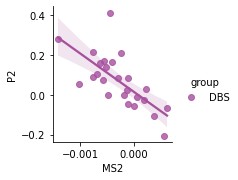

In [22]:
# Correlation scatter plot

from scipy import stats

df_fea = pd.read_csv("./WEiDA4_atlasAAL78_DBS/dynamic_features.csv")
df_fea['group'] = 'DBS'

plt.figure(dpi=500)
sns.pairplot(df_fea, y_vars='P2', x_vars='MS2', kind='reg', palette=["#A6519E"],hue='group')
r, p = stats.spearmanr(data['P2'],data['MS2'])
print(r,p)
# plt.savefig(r"./figure/MS-P2_DBS.png", dpi=500) 

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1324\3430736527.py:9: DeprecationWarning: setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.
  off[:,i] = list(ts_state[210*(16+i):210*(16+i+1)])


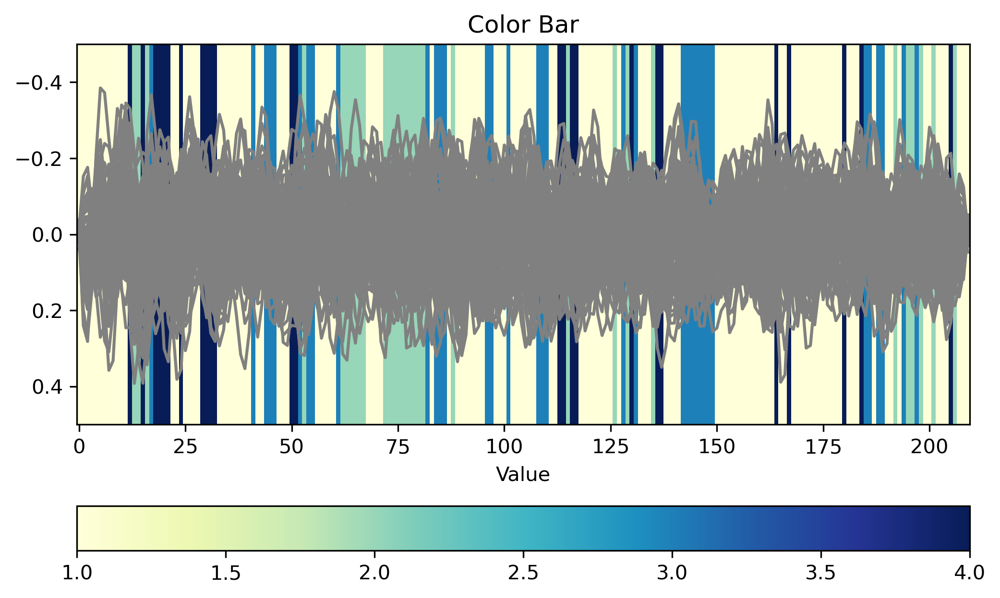

In [27]:
# Visualization of state time series

import glob

# state time series
ts_state = pd.read_csv("./WEiDA4_atlasAAL78_DBS/State_ts.csv", header=None)
ts_state = ts_state.values

off = np.zeros([210,25])
for i in range(25):
    off[:,i] = list(ts_state[210*(16+i):210*(16+i+1)])

off_max = np.argmax(np.apply_along_axis(np.bincount, axis=1, arr=off.astype(int)), axis=1)

stnoff = glob.glob("./data/DBS/sub-STNoff*.csv")   # BOLD time series

ts_aver=np.zeros([210,78])
for i in range(25):
    ts = pd.read_csv(stnoff[i], index_col=0)
    ts = ts.values
    ts_aver = ts_aver + ts
ts_aver_off = ts_aver / 16

array = off_max
x = range(210)

cmap = plt.cm.get_cmap('YlGnBu')

plt.figure(figsize=(8, 5), dpi=300)
plt.imshow([array], cmap=cmap, aspect="auto")
plt.colorbar(orientation='horizontal')

for i in range(78):
    plt.plot(x,ts_aver_off[:,i]/3, color='gray')

plt.title('Color Bar')
plt.xlabel('Value')

plt.show()

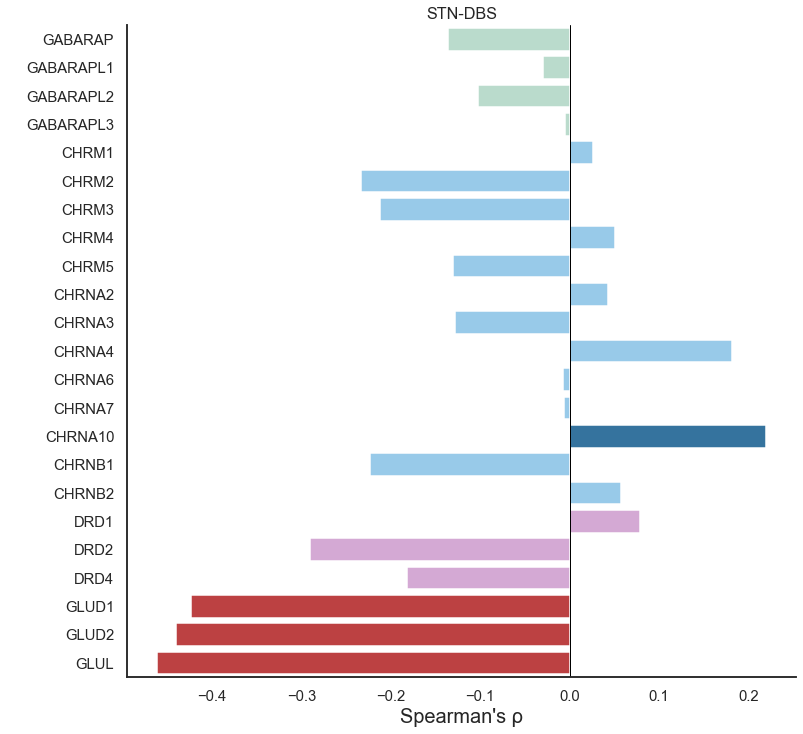

In [34]:
# nodal-FS overlaps with PD-related gene expression

def addHue(df):
    acetylcholine = ["CHRM1", "CHRM2", "CHRM3", "CHRM4", "CHRM5", "CHRNA2", "CHRNA3", "CHRNA4", "CHRNA6", "CHRNA7", "CHRNA10", "CHRNB1", "CHRNB2"]  # 乙酰胆碱
    dopamine = ["DRD1", "DRD2", "DRD4"]
    G_aminobutyric_acid = ['GABARAP','GABARAPL1','GABARAPL2','GABARAPL3']
    glutamate=['GLUD1','GLUD2','GLUL']
    df["Hue"] = np.zeros(len(df))
    for i in range(len(df)):
        if df.Gene.iloc[i] in G_aminobutyric_acid:
            if df.pValue.iloc[i] <= 0.05:
                df["Hue"].iloc[i] = 2
            else: 
                df["Hue"].iloc[i] = 1
        elif df.Gene.iloc[i] in acetylcholine:
            if df.pValue.iloc[i] <= 0.05:
                df["Hue"].iloc[i] = 4
            else:
                df["Hue"].iloc[i] = 3
        elif df.Gene.iloc[i] in glutamate:
            if df.pValue.iloc[i] <=0.05:
                df["Hue"].iloc[i] = 6
            else:
                df["Hue"].iloc[i] = 5
        elif df.Gene.iloc[i] in dopamine:
            if df.pValue.iloc[i] <= 0.05:
                df["Hue"].iloc[i] = 8
            else:
                df["Hue"].iloc[i] = 7
    return(df)

## Visualize
df = pd.read_csv("./WEiDA4_atlasAAL78_DBS/Transmitter_nodalFS_spacorr_MNIparc78_perm10k_spearmanr.csv", index_col=0)
df = addHue(df)
## set colours and parameters
sns.set_palette(sns.color_palette('Paired', 16))
sns.set_style("white")  
sns.set_context("talk", font_scale=0.9)
## plot
fig, ax = plt.subplots(figsize=(12,12))
sns.barplot(x="rho", y="Gene", data=df, orient="h", hue="Hue", dodge=False, saturation=0.7, hue_order=[1,2,3,4,5,6,7,8], palette=['#B3E2CD','green',"lightskyblue",'#1f77b4','lightcoral','#d62728','plum','darkorchid'], alpha=1)
ax.get_legend().set_visible(False)
plt.title('STN-DBS')
plt.xlabel("Spearman's ρ", fontsize=20)
plt.ylabel(" ")
plt.axvline(0, c="black", linewidth=1)
sns.despine()
## save figure
# plt.savefig("./figure/DBSgene_expression_r.png", dpi=500) 

<Figure size 3000x2000 with 0 Axes>

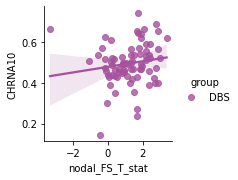

In [14]:
data = pd.read_csv("./WEiDA4_atlasAAL78_DBS/Transmitter_nodalFS_Tmap.csv")
data['group']='DBS'
plt.figure(dpi=500)
sns.pairplot(data, y_vars='CHRNA10', x_vars='nodal_FS_T_stat', kind='reg', palette=["#A6519E"],hue='group')
# plt.savefig("./figure/nodalFSt_CHRNA10_DBS.png", dpi=500) 

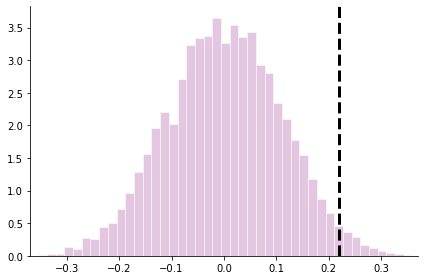

In [13]:
# null model correlations

from scipy.stats import spearmanr

nodalFS_null = pd.read_csv("./WEiDA4_atlasAAL78_DBS/Rotated112_MNIparc78_perm10k_FStmap.csv", index_col=0)
gene = pd.read_csv("./WEiDA4_atlasAAL78_tTIS/Transmitter_nodalFS_Tmap.csv", index_col=0)
gene = np.array(gene['CHRNA10'])

null_corr = [None] * 10000
for i in range(10000):
    coef, p_value = spearmanr(gene, nodalFS_null.iloc[:,i])
    null_corr[i] = coef
    
fig, axs = plt.subplots(1)
axs.hist(null_corr, bins=50, density=True, edgecolor='white', lw=0.5, color="#E3C6E0")  # bins参数指定直方图的柱子数量

rho = pd.read_csv("./WEiDA4_atlasAAL78_DBS/Transmitter_nodalFS_spacorr_MNIparc78_perm10k_spearmanr.csv", index_col=0)
idx = rho.index[rho['Gene'] == 'CHRNA10']
axs.axvline(rho.loc[idx,'rho'].item(), lw=3, ls='--', color='k')

axs.spines['top'].set_visible(False)
axs.spines['right'].set_visible(False)
axs.set_xlim((-0.37, 0.37))
fig.tight_layout()

# plt.savefig("./figure/CHRNA10_nodalFS_null_DBS.png", dpi=500) 

In [19]:
# Comparisons of WEiDA-inferred metastable states across atlases

import nibabel as nib

# state brain map based on AAL1 cortical atlas transformed to the fsaverage5 space
imgl = nib.load("./WEiDA4_atlasAAL78_DBS/State3_MNIparc78_surffsag10k_L.gii.gz")
imgr = nib.load("./WEiDA4_atlasAAL78_DBS/State3_MNIparc78_surffsag10k_R.gii.gz")
labell = imgl.agg_data()
labelr = imgr.agg_data()

# state brain map based on Schaefer100 atlas transformed to the fsaverage5 space
imgl = nib.load("./WEiDA4_atlasSchaefer100_DBS/State3_MNIparc78_surffsag10k_L.gii.gz")
imgr = nib.load("./WEiDA4_atlasSchaefer100_DBS/State3_MNIparc78_surffsag10k_L.gii.gz")
labells = imgl.agg_data()
labelrs = imgr.agg_data()

schaefer = list(labells) + list(labelrs)
aal = list(labell) + list(labelr)
print(len(aal))

data = pd.DataFrame()
data['Schaefer'] = schaefer
data['aal'] = aal

group = []
for i in range(10242):
    group.append(0)
for i in range(10242,20484):
    group.append(1)
data['group'] = group    

20484


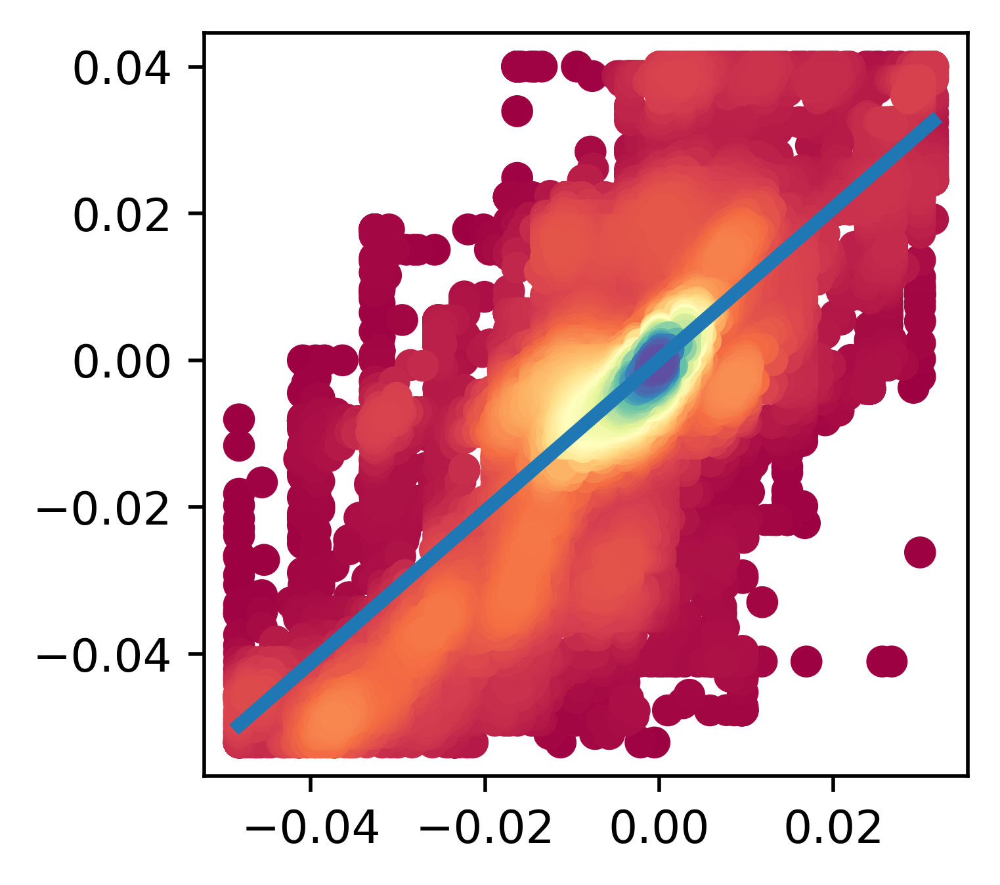

In [20]:
# scatter density plot

from numpy import polyfit, poly1d
import matplotlib as mpl
from matplotlib import cm
from matplotlib import ticker
from matplotlib import colors
import matplotlib.font_manager as fm
from scipy.stats import gaussian_kde

np.random.seed(2024)

x = np.array(data['Schaefer'])
y = np.array(data['aal'])

x_and_y = np.vstack([x, y])
kde = gaussian_kde(x_and_y)
z = kde(x_and_y)
idx = z.argsort()
x, y, z = x[idx], y[idx], z[idx]

is_cbar = True

fig, ax = plt.subplots(figsize=(3, 3), dpi=500)

my_cmap = "Spectral"

ax.scatter(x, y, c=z, cmap=my_cmap)

y_fit = polyfit(x, y, 1)
y_fit_1d = np.poly1d(y_fit)
y_hat = np.polyval(y_fit, x)

xtick = np.linspace(min(x), max(x), 1000)
plt.plot(xtick, y_fit_1d(xtick), color="tab:blue", lw=3)

# plt.savefig("./figure/across_atlas_state3.png", dpi=500)
plt.show()